<a href="https://colab.research.google.com/github/Annabelle2915/Machine-Learning-Projects/blob/main/FetalHealthClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Task 4

## Load Dataset using Google Drive

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import io
import requests
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
# Import bone_marrow.csv dataset to path variable from google drive
import pandas as pd
path = "/content/gdrive/MyDrive/Colab Notebooks/fetal_health.csv"

# Assign dataset to dataframe named ori_df from variable path
ori_df = pd.read_csv(path)

FileNotFoundError: ignored

## Data Understanding

In [ ]:
# Identify the shape of the dataset
ori_df.shape

(2126, 22)

In [ ]:
#show basic information about the dataset such as entries, data types, etc.
ori_df.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [ ]:
# Show the top 30 rows of records from dataset corresonding its columns
ori_df.head(30)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.000,0.000,0.000,0.0,0.000,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.000,0.006,0.003,0.0,0.000,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.000,0.008,0.003,0.0,0.000,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.000,0.008,0.003,0.0,0.000,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.000,0.008,0.000,0.0,0.000,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0
5,134.0,0.001,0.000,0.010,0.009,0.0,0.002,26.0,5.9,0.0,...,50.0,200.0,5.0,3.0,76.0,107.0,107.0,170.0,0.0,3.0
6,134.0,0.001,0.000,0.013,0.008,0.0,0.003,29.0,6.3,0.0,...,50.0,200.0,6.0,3.0,71.0,107.0,106.0,215.0,0.0,3.0
7,122.0,0.000,0.000,0.000,0.000,0.0,0.000,83.0,0.5,6.0,...,62.0,130.0,0.0,0.0,122.0,122.0,123.0,3.0,1.0,3.0
8,122.0,0.000,0.000,0.002,0.000,0.0,0.000,84.0,0.5,5.0,...,62.0,130.0,0.0,0.0,122.0,122.0,123.0,3.0,1.0,3.0
9,122.0,0.000,0.000,0.003,0.000,0.0,0.000,86.0,0.3,6.0,...,62.0,130.0,1.0,0.0,122.0,122.0,123.0,1.0,1.0,3.0


In [ ]:
ori_df['fetal_health']

0       2.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
2121    2.0
2122    2.0
2123    2.0
2124    2.0
2125    1.0
Name: fetal_health, Length: 2126, dtype: float64

In [ ]:
# Show the top 30 rows of records from dataset corresonding its columns AFTER REASSIGN
ori_df.head(30)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.000,0.000,0.000,0.0,0.000,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.000,0.006,0.003,0.0,0.000,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.000,0.008,0.003,0.0,0.000,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.000,0.008,0.003,0.0,0.000,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.000,0.008,0.000,0.0,0.000,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0
5,134.0,0.001,0.000,0.010,0.009,0.0,0.002,26.0,5.9,0.0,...,50.0,200.0,5.0,3.0,76.0,107.0,107.0,170.0,0.0,3.0
6,134.0,0.001,0.000,0.013,0.008,0.0,0.003,29.0,6.3,0.0,...,50.0,200.0,6.0,3.0,71.0,107.0,106.0,215.0,0.0,3.0
7,122.0,0.000,0.000,0.000,0.000,0.0,0.000,83.0,0.5,6.0,...,62.0,130.0,0.0,0.0,122.0,122.0,123.0,3.0,1.0,3.0
8,122.0,0.000,0.000,0.002,0.000,0.0,0.000,84.0,0.5,5.0,...,62.0,130.0,0.0,0.0,122.0,122.0,123.0,3.0,1.0,3.0
9,122.0,0.000,0.000,0.003,0.000,0.0,0.000,86.0,0.3,6.0,...,62.0,130.0,1.0,0.0,122.0,122.0,123.0,1.0,1.0,3.0


In [ ]:
# Show the statistical information of numerical variables in the dataset
ori_df.describe()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,...,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,...,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,...,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,...,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


In [ ]:
# Identifying the unique elements under the fetal_health variables
ori_df['fetal_health'].unique()


array([2., 1., 3.])

### **Summary of Data Understanding**

---

By using necessary pandas functions, it is observed that all of the data values within this dataset is in numerical float type, where there are no null values as the non null count are all 2126, showing that there are 2126 records for this dataset.

In [ ]:
#reassigned_df = ori_df.copy()
#reassigned_df.fetal_health = reassigned_df.fetal_health.astype('int')
#reassigned_df.fetal_health = reassigned_df.fetal_health.replace([1,2,3],['Normal','Suspect','Pathological'])

In [ ]:
# Check on the reassign unique value on fetal_health
#reassigned_df['fetal_health'].unique()

In [ ]:
ori_df.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

## Data Cleaning ( Identify missing value and duplicated data )

In [ ]:
# Handling non standard missing values
ori_df.isnull().sum()


baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode                          

In [ ]:
# Since there are no standard blank missing values for pandas function to detect,
# we will need to identify the number of non standard blank missing values in this dataframe

# Identify the non standard missing value of '?' in each column by descending order
import numpy as np
print("Number of non standard '?' missing value in the dataset: ")
df_replaced = ori_df.replace(['?', '!'], np.NaN)
df_replaced.head(15)
print(df_replaced.isna().sum().sort_values(ascending=False))

Number of non standard '?' missing value in the dataset: 
baseline value                                            0
accelerations                                             0
histogram_tendency                                        0
histogram_variance                                        0
histogram_median                                          0
histogram_mean                                            0
histogram_mode                                            0
histogram_number_of_zeroes                                0
histogram_number_of_peaks                                 0
histogram_max                                             0
histogram_min                                             0
histogram_width                                           0
mean_value_of_long_term_variability                       0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_short_term_variability                      0
abnormal_short_term_variability           

In [ ]:
# Show true if there are duplciated values , False if there are none
ori_df.duplicated().any()

True

In [ ]:
# Total number of duplicated values
ori_df.duplicated().sum()

13

In [ ]:
# To check number of duplicated values compared with non duplicated values
print(ori_df.duplicated().value_counts())


False    2113
True       13
dtype: int64


In [ ]:
ori_df[ori_df.duplicated(keep=False)]

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
67,140.0,0.007,0.000,0.004,0.0,0.0,0.0,34.0,1.2,0.0,...,119.0,179.0,2.0,0.0,156.0,153.0,155.0,5.0,0.0,1.0
68,140.0,0.007,0.000,0.004,0.0,0.0,0.0,34.0,1.2,0.0,...,119.0,179.0,2.0,0.0,156.0,153.0,155.0,5.0,0.0,1.0
229,123.0,0.003,0.003,0.000,0.0,0.0,0.0,52.0,0.8,2.0,...,50.0,140.0,7.0,0.0,129.0,128.0,130.0,4.0,1.0,1.0
233,123.0,0.000,0.000,0.000,0.0,0.0,0.0,49.0,0.8,7.0,...,63.0,137.0,2.0,0.0,129.0,127.0,129.0,2.0,1.0,1.0
234,123.0,0.000,0.000,0.000,0.0,0.0,0.0,49.0,0.8,7.0,...,63.0,137.0,2.0,0.0,129.0,127.0,129.0,2.0,1.0,1.0
304,145.0,0.000,0.020,0.000,0.0,0.0,0.0,77.0,0.2,45.0,...,129.0,150.0,1.0,0.0,146.0,145.0,147.0,0.0,1.0,2.0
306,145.0,0.000,0.020,0.000,0.0,0.0,0.0,77.0,0.2,45.0,...,129.0,150.0,1.0,0.0,146.0,145.0,147.0,0.0,1.0,2.0
323,135.0,0.000,0.000,0.000,0.0,0.0,0.0,62.0,0.5,71.0,...,71.0,168.0,3.0,0.0,143.0,142.0,144.0,1.0,1.0,3.0
324,135.0,0.000,0.000,0.000,0.0,0.0,0.0,62.0,0.5,71.0,...,71.0,168.0,3.0,0.0,143.0,142.0,144.0,1.0,1.0,3.0
326,144.0,0.000,0.019,0.000,0.0,0.0,0.0,76.0,0.4,61.0,...,71.0,152.0,3.0,0.0,145.0,144.0,146.0,2.0,1.0,2.0


In [ ]:
# Drop the duplicated values
drop_duplicated_df = ori_df.drop_duplicates( )



In [ ]:
# Check on the shape of the datasets after dropping the duplicated datasets
drop_duplicated_df.shape

(2113, 22)

In [ ]:
# Check on the shape of the datasets after dropping the duplicated datasets
drop_duplicated_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2113 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2113 non-null   float64
 1   accelerations                                           2113 non-null   float64
 2   fetal_movement                                          2113 non-null   float64
 3   uterine_contractions                                    2113 non-null   float64
 4   light_decelerations                                     2113 non-null   float64
 5   severe_decelerations                                    2113 non-null   float64
 6   prolongued_decelerations                                2113 non-null   float64
 7   abnormal_short_term_variability                         2113 non-null   float64
 8   mean_value_of_short_term_variability  

In [ ]:
drop_duplicated_df.duplicated().any()

False

In [ ]:
drop_duplicated_df.duplicated().sum()

0

### **Summary of Data Cleaning for missing values and duplicated values**

---

As shown above, there are no standard missing values nor non standard missing. However, there are 13 values that are duplicated, where they all removed in the end, showing 2113 records for each data fields in the end.

## Data Cleaning ( Removing Outliers )

=======*Removing outliers is in the end excluded to prevent overfitting during prediction*=======

In [ ]:
# Display a BoxPlot
import pandas as pd
import numpy as np
import matplotlib
import seaborn as sbn

In [ ]:
"""
# Removing outliers for baseline value column

# Visualising data with a boxplot using seaborn library
sbn.boxplot(drop_duplicated_df['baseline value'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["baseline value"].quantile(0.25)
Q3 = drop_duplicated_df["baseline value"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence to see which values are outside of generalisation
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["baseline value"] < Lower_Fence) | (drop_duplicated_df["baseline value"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df1 = drop_duplicated_df[~((drop_duplicated_df["baseline value"] < Lower_Fence) | (drop_duplicated_df["baseline value"] > Upper_Fence))]
print(f"removed_outliers_df1 shape after removed outliers : {removed_outliers_df1.shape}\n")

SyntaxError: ignored

In [ ]:
"""
# Removing outliers for accelerations column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['accelerations'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["accelerations"].quantile(0.25)
Q3 = drop_duplicated_df["accelerations"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["accelerations"] < Lower_Fence) | (drop_duplicated_df["accelerations"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df2 = removed_outliers_df1[~((removed_outliers_df1["accelerations"] < Lower_Fence) | (removed_outliers_df1["accelerations"] > Upper_Fence))]
print(f"removed_outliers_df2 shape after removed outliers : {removed_outliers_df2.shape}\n")

In [ ]:
"""
# Removing outliers for fetal_movement column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['fetal_movement'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["fetal_movement"].quantile(0.25)
Q3 = drop_duplicated_df["fetal_movement"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["fetal_movement"] < Lower_Fence) | (drop_duplicated_df["fetal_movement"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df3 = removed_outliers_df2[~((removed_outliers_df2["fetal_movement"] < Lower_Fence) | (removed_outliers_df2["fetal_movement"] > Upper_Fence))]
print(f"removed_outliers_df3 shape after removed outliers : {removed_outliers_df3.shape}\n")

In [ ]:
"""
# Removing outliers for uterine_contractions column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['uterine_contractions'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["uterine_contractions"].quantile(0.25)
Q3 = drop_duplicated_df["uterine_contractions"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["uterine_contractions"] < Lower_Fence) | (drop_duplicated_df["uterine_contractions"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df4 = removed_outliers_df3[~((removed_outliers_df3["uterine_contractions"] < Lower_Fence) | (removed_outliers_df3["uterine_contractions"] > Upper_Fence))]
print(f"removed_outliers_df4 shape after removed outliers : {removed_outliers_df4.shape}\n")

In [ ]:
"""
# Removing outliers for light_decelerations column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['light_decelerations'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["light_decelerations"].quantile(0.25)
Q3 = drop_duplicated_df["light_decelerations"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["light_decelerations"] < Lower_Fence) | (drop_duplicated_df["light_decelerations"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df5 = removed_outliers_df4[~((removed_outliers_df4["light_decelerations"] < Lower_Fence) | (removed_outliers_df4["light_decelerations"] > Upper_Fence))]
print(f"removed_outliers_df5 shape after removed outliers : {removed_outliers_df5.shape}\n")

In [ ]:
"""
# Removing outliers for severe_decelerations column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['severe_decelerations'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["severe_decelerations"].quantile(0.25)
Q3 = drop_duplicated_df["severe_decelerations"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["severe_decelerations"] < Lower_Fence) | (drop_duplicated_df["severe_decelerations"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df6 = removed_outliers_df5[~((removed_outliers_df5["severe_decelerations"] < Lower_Fence) | (removed_outliers_df5["severe_decelerations"] > Upper_Fence))]
print(f"removed_outliers_df6 shape after removed outliers : {removed_outliers_df6.shape}\n")

In [ ]:
"""
# Removing outliers for prolongued_decelerations column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['prolongued_decelerations'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["prolongued_decelerations"].quantile(0.25)
Q3 = drop_duplicated_df["prolongued_decelerations"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["prolongued_decelerations"] < Lower_Fence) | (drop_duplicated_df["prolongued_decelerations"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df7 = removed_outliers_df6[~((removed_outliers_df6["prolongued_decelerations"] < Lower_Fence) | (removed_outliers_df6["prolongued_decelerations"] > Upper_Fence))]
print(f"removed_outliers_df7 shape after removed outliers : {removed_outliers_df7.shape}\n")

In [ ]:
"""
# Removing outliers for abnormal_short_term_variability column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['abnormal_short_term_variability'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["abnormal_short_term_variability"].quantile(0.25)
Q3 = drop_duplicated_df["abnormal_short_term_variability"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["abnormal_short_term_variability"] < Lower_Fence) | (drop_duplicated_df["abnormal_short_term_variability"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df8 = removed_outliers_df7[~((removed_outliers_df7["abnormal_short_term_variability"] < Lower_Fence) | (removed_outliers_df7["abnormal_short_term_variability"] > Upper_Fence))]
print(f"removed_outliers_df8 shape after removed outliers : {removed_outliers_df8.shape}\n")

In [ ]:
"""
# Removing outliers for mean_value_of_short_term_variability column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['mean_value_of_short_term_variability'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["mean_value_of_short_term_variability"].quantile(0.25)
Q3 = drop_duplicated_df["mean_value_of_short_term_variability"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["mean_value_of_short_term_variability"] < Lower_Fence) | (drop_duplicated_df["mean_value_of_short_term_variability"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df9 = removed_outliers_df8[~((removed_outliers_df8["mean_value_of_short_term_variability"] < Lower_Fence) | (removed_outliers_df8["mean_value_of_short_term_variability"] > Upper_Fence))]
print(f"removed_outliers_df9 shape after removed outliers : {removed_outliers_df9.shape}\n")

In [ ]:
"""
# Removing outliers for percentage_of_time_with_abnormal_long_term_variability column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['percentage_of_time_with_abnormal_long_term_variability'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["percentage_of_time_with_abnormal_long_term_variability"].quantile(0.25)
Q3 = drop_duplicated_df["percentage_of_time_with_abnormal_long_term_variability"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["percentage_of_time_with_abnormal_long_term_variability"] < Lower_Fence) | (drop_duplicated_df["percentage_of_time_with_abnormal_long_term_variability"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df10 = removed_outliers_df9[~((removed_outliers_df9["percentage_of_time_with_abnormal_long_term_variability"] < Lower_Fence) | (removed_outliers_df9["percentage_of_time_with_abnormal_long_term_variability"] > Upper_Fence))]
print(f"removed_outliers_df10 shape after removed outliers : {removed_outliers_df10.shape}\n")

In [ ]:
"""
# Removing outliers for mean_value_of_long_term_variability column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['mean_value_of_long_term_variability'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["mean_value_of_long_term_variability"].quantile(0.25)
Q3 = drop_duplicated_df["mean_value_of_long_term_variability"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["mean_value_of_long_term_variability"] < Lower_Fence) | (drop_duplicated_df["mean_value_of_long_term_variability"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df11 = removed_outliers_df10[~((removed_outliers_df10["mean_value_of_long_term_variability"] < Lower_Fence) | (removed_outliers_df10["mean_value_of_long_term_variability"] > Upper_Fence))]
print(f"removed_outliers_df11 shape after removed outliers : {removed_outliers_df11.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_width column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_width'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_width"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_width"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_width"] < Lower_Fence) | (drop_duplicated_df["histogram_width"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df12 = removed_outliers_df11[~((removed_outliers_df11["histogram_width"] < Lower_Fence) | (removed_outliers_df11["histogram_width"] > Upper_Fence))]
print(f"removed_outliers_df12 shape after removed outliers : {removed_outliers_df12.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_min column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_min'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_min"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_min"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_min"] < Lower_Fence) | (drop_duplicated_df["histogram_min"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df13 = removed_outliers_df12[~((removed_outliers_df12["histogram_min"] < Lower_Fence) | (removed_outliers_df12["histogram_min"] > Upper_Fence))]
print(f"removed_outliers_df13 shape after removed outliers : {removed_outliers_df13.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_max column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_max'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_max"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_max"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_max"] < Lower_Fence) | (drop_duplicated_df["histogram_max"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df14 = removed_outliers_df13[~((removed_outliers_df13["histogram_max"] < Lower_Fence) | (removed_outliers_df13["histogram_max"] > Upper_Fence))]
print(f"removed_outliers_df14 shape after removed outliers : {removed_outliers_df14.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_number_of_peaks column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_number_of_peaks'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_number_of_peaks"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_number_of_peaks"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_number_of_peaks"] < Lower_Fence) | (drop_duplicated_df["histogram_number_of_peaks"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df15 = removed_outliers_df14[~((removed_outliers_df14["histogram_number_of_peaks"] < Lower_Fence) | (removed_outliers_df14["histogram_number_of_peaks"] > Upper_Fence))]
print(f"removed_outliers_df15 shape after removed outliers : {removed_outliers_df15.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_number_of_zeroes column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_number_of_zeroes'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_number_of_zeroes"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_number_of_zeroes"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_number_of_zeroes"] < Lower_Fence) | (drop_duplicated_df["histogram_number_of_zeroes"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df16 = removed_outliers_df15[~((removed_outliers_df15["histogram_number_of_zeroes"] < Lower_Fence) | (removed_outliers_df15["histogram_number_of_zeroes"] > Upper_Fence))]
print(f"removed_outliers_df16 shape after removed outliers : {removed_outliers_df16.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_mode column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_mode'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_mode"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_mode"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_mode"] < Lower_Fence) | (drop_duplicated_df["histogram_mode"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df17 = removed_outliers_df16[~((removed_outliers_df16["histogram_mode"] < Lower_Fence) | (removed_outliers_df16["histogram_mode"] > Upper_Fence))]
print(f"removed_outliers_df17 shape after removed outliers : {removed_outliers_df17.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_mean column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_mean'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_mean"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_mean"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_mean"] < Lower_Fence) | (drop_duplicated_df["histogram_mean"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df18 = removed_outliers_df17[~((removed_outliers_df17["histogram_mean"] < Lower_Fence) | (removed_outliers_df17["histogram_mean"] > Upper_Fence))]
print(f"removed_outliers_df18 shape after removed outliers : {removed_outliers_df18.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_median column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_median'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_median"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_median"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_median"] < Lower_Fence) | (drop_duplicated_df["histogram_median"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df19 = removed_outliers_df18[~((removed_outliers_df18["histogram_median"] < Lower_Fence) | (removed_outliers_df18["histogram_median"] > Upper_Fence))]
print(f"removed_outliers_df19 shape after removed outliers : {removed_outliers_df19.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_variance column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_variance'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_variance"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_variance"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_variance"] < Lower_Fence) | (drop_duplicated_df["histogram_variance"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df20 = removed_outliers_df19[~((removed_outliers_df19["histogram_variance"] < Lower_Fence) | (removed_outliers_df19["histogram_variance"] > Upper_Fence))]
print(f"removed_outliers_df20 shape after removed outliers : {removed_outliers_df20.shape}\n")

In [ ]:
"""
# Removing outliers for histogram_tendency column

# Visualising data with a boxplot
sbn.boxplot(drop_duplicated_df['histogram_tendency'])

# Compute the Interquartile Range (IQR)
Q1 = drop_duplicated_df["histogram_tendency"].quantile(0.25)
Q3 = drop_duplicated_df["histogram_tendency"].quantile(0.75)
IQR = Q3 - Q1
print ("IQR: %.2f" %IQR)

# Calculate the Lower and Upper Fence
Lower_Fence = Q1 - (1.5 * IQR)
print ("Lower_Fence: %.2f" %Lower_Fence)
Upper_Fence = Q3 + (1.5 * IQR)
print ("Upper_Fence: %.2f" %Upper_Fence)

# Display Outliers
print("Data Outliers: \n")
print (drop_duplicated_df[((drop_duplicated_df["histogram_tendency"] < Lower_Fence) | (drop_duplicated_df["histogram_tendency"] > Upper_Fence))])
print()

# Removing Outliers and storing remaining data
print(f"Original fetal_health df shape: {ori_df.shape}\n")
print(f"Removed duplicated df shape: {drop_duplicated_df.shape}\n")
removed_outliers_df21 = removed_outliers_df20[~((removed_outliers_df20["histogram_tendency"] < Lower_Fence) | (removed_outliers_df20["histogram_tendency"] > Upper_Fence))]
print(f"removed_outliers_df21 shape after removed outliers : {removed_outliers_df21.shape}\n")

*****PLEASE PRESS RUN AFTER AT CELL EDA BELOW*****

### Exploratory Data Analytics (EDA)

**Data Exploration of Each Variables**

In [ ]:
df_cleaned = drop_duplicated_df.copy()

In [ ]:
# investigate the structure of cleaned dataset
print(df_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2113 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2113 non-null   float64
 1   accelerations                                           2113 non-null   float64
 2   fetal_movement                                          2113 non-null   float64
 3   uterine_contractions                                    2113 non-null   float64
 4   light_decelerations                                     2113 non-null   float64
 5   severe_decelerations                                    2113 non-null   float64
 6   prolongued_decelerations                                2113 non-null   float64
 7   abnormal_short_term_variability                         2113 non-null   float64
 8   mean_value_of_short_term_variability  

In [ ]:
# investigate the shape of cleaned dataset
df_cleaned.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [ ]:
df_cleaned.describe().T[['mean','min','25%','50%','75%','max']]

,mean,min,25%,50%,75%,max
baseline value,133.304780,106.0,126.000,133.000,140.000,160.000
accelerations,0.003188,0.0,0.000,0.002,0.006,0.019
fetal_movement,0.009517,0.0,0.000,0.000,0.003,0.481
uterine_contractions,0.004387,0.0,0.002,0.005,0.007,0.015
light_decelerations,0.001901,0.0,0.000,0.000,0.003,0.015
severe_decelerations,0.000003,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,0.000159,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,46.993848,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,1.335021,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,9.795078,0.0,0.000,0.000,11.000,91.000


In [ ]:
#median of cleaned data
print("The median of each column")
df_cleaned.median()

The median of each column


baseline value                                            133.000
accelerations                                               0.002
fetal_movement                                              0.000
uterine_contractions                                        0.005
light_decelerations                                         0.000
severe_decelerations                                        0.000
prolongued_decelerations                                    0.000
abnormal_short_term_variability                            49.000
mean_value_of_short_term_variability                        1.200
percentage_of_time_with_abnormal_long_term_variability      0.000
mean_value_of_long_term_variability                         7.400
histogram_width                                            68.000
histogram_min                                              93.000
histogram_max                                             162.000
histogram_number_of_peaks                                   4.000
histogram_

In [ ]:
#sum of cleaned data
print("The sum of each column: ")
df_cleaned.sum()

The sum of each column: 


baseline value                                            281673.000
accelerations                                                  6.737
fetal_movement                                                20.110
uterine_contractions                                           9.270
light_decelerations                                            4.017
severe_decelerations                                           0.007
prolongued_decelerations                                       0.337
abnormal_short_term_variability                            99298.000
mean_value_of_short_term_variability                        2820.900
percentage_of_time_with_abnormal_long_term_variability     20697.000
mean_value_of_long_term_variability                        17256.100
histogram_width                                           149041.000
histogram_min                                             197702.000
histogram_max                                             346743.000
histogram_number_of_peaks         

In [ ]:
#range of each column in cleaned_data
col_range = df_cleaned.max() - df_cleaned.min()
print("The range for each column: ")
print(col_range)

The range for each column: 
baseline value                                             54.000
accelerations                                               0.019
fetal_movement                                              0.481
uterine_contractions                                        0.015
light_decelerations                                         0.015
severe_decelerations                                        0.001
prolongued_decelerations                                    0.005
abnormal_short_term_variability                            75.000
mean_value_of_short_term_variability                        6.800
percentage_of_time_with_abnormal_long_term_variability     91.000
mean_value_of_long_term_variability                        50.700
histogram_width                                           177.000
histogram_min                                             109.000
histogram_max                                             116.000
histogram_number_of_peaks                       

In [ ]:
# Median of cleaned data
print("The median of each column: ")
df_cleaned.median()

The median of each column: 


baseline value                                            133.000
accelerations                                               0.002
fetal_movement                                              0.000
uterine_contractions                                        0.005
light_decelerations                                         0.000
severe_decelerations                                        0.000
prolongued_decelerations                                    0.000
abnormal_short_term_variability                            49.000
mean_value_of_short_term_variability                        1.200
percentage_of_time_with_abnormal_long_term_variability      0.000
mean_value_of_long_term_variability                         7.400
histogram_width                                            68.000
histogram_min                                              93.000
histogram_max                                             162.000
histogram_number_of_peaks                                   4.000
histogram_

In [ ]:
#calculate the mean and median for normal , suspect and pathlogical
df_cleaned.groupby('fetal_health').agg(['mean','median'])

baseline value        accelerations        fetal_movement         \
                       mean median          mean median           mean median   
fetal_health                                                                    
1.0              131.998177  132.0      0.004002  0.003       0.008002  0.000   
2.0              141.650685  143.0      0.000277  0.000       0.008284  0.000   
3.0              131.668571  132.0      0.000394  0.000       0.025823  0.001   

             uterine_contractions         light_decelerations         ...  \
                             mean  median                mean median  ...   
fetal_health                                                          ...   
1.0                      0.004801  0.0050            0.001952  0.000  ...   
2.0                      0.002404  0.0015            0.000541  0.000  ...   
3.0                      0.003806  0.0030            0.003691  0.002  ...   

             histogram_mode        histogram_mean        histogram_median  \
                       mean median           mean median             mean   
fetal_health                                                                
1.0              138.286756  138.0     135.116039  135.0       138.482382   
2.0              146.551370  147.0     144.746575  146.0       147.061644   
3.0              114.445714  122.0     112.811429  106.0       119.422857   

                    histogram_variance        histogram_tendency         
             median               mean median               mean median  
fetal_health                                                             
1.0           139.0          17.556501    9.0           0.341434    0.0  
2.0           148.0           7.277397    1.0           0.428082    0.0  
3.0           116.0          51.017143   37.0          -0.080000    0.0  

[3 rows x 42 columns]

**Check the Skewness of Each Data Variables**

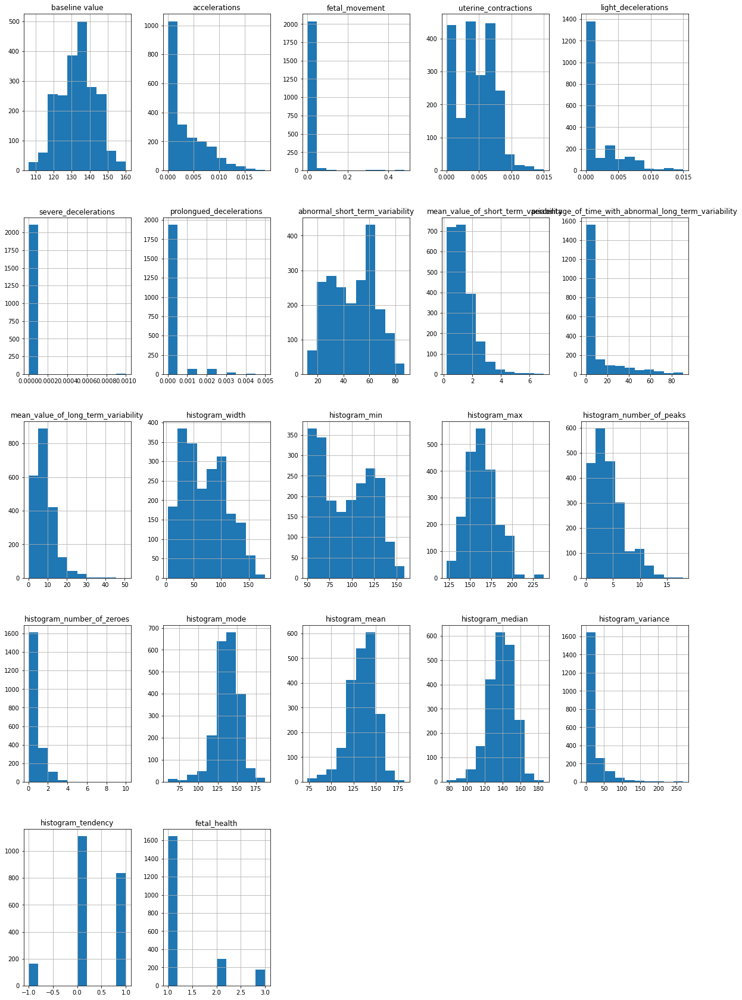

In [ ]:
data_hist_plot = df_cleaned.hist(figsize = (20,30))

**Summary of Checking the Skewness of Each Data Variables**

---

it can be seen that "light_ decelerations", "precentage_ of_ time_ with_a bnormal_ long_ term_ variability", “histogram_number_of_zeroes”, “histogram_variance”, fetal_movement”, etc., are not normally distributed, where they are more to the left, while other variables are properly skewed as they show a bell curve of normal distribution skewness such as variable  “baseline value”, “histogram_median”, etc.


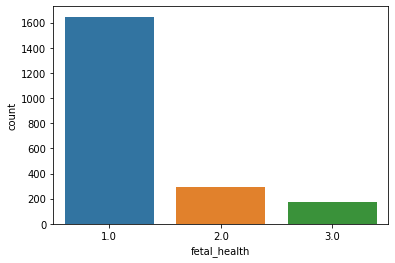

In [ ]:
# Check for the counts of each class in targeted variable
sns.countplot(data= df_cleaned, x="fetal_health")

**Exploration of Relationship Between Each Variables**

In [ ]:
import sklearn
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import preprocessing
%matplotlib inline

In [ ]:
#scatter matrix
sns.pairplot(df_cleaned, hue='fetal_health', diag_kind='hist', height=5)


**Feature Selection**

In [ ]:
#Identifying the correlation between variables
df_cleaned.corr()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
baseline value,1.000000,-0.081885,-0.033949,-0.149587,-0.159836,-0.053706,-0.105003,0.303502,-0.278344,0.283918,...,0.360129,0.273402,-0.113242,-0.004807,0.708074,0.722152,0.788487,-0.134458,0.294412,0.146077
accelerations,-0.081885,1.000000,0.048114,0.086174,-0.110595,-0.043237,-0.128682,-0.280495,0.206762,-0.373507,...,-0.155306,0.392684,0.189209,-0.007360,0.243083,0.270266,0.272507,0.124433,0.030670,-0.363947
fetal_movement,-0.033949,0.048114,1.000000,-0.069867,0.048795,-0.011022,0.265802,-0.104876,0.121532,-0.074900,...,-0.154297,0.099703,0.164645,-0.018122,-0.061496,-0.089938,-0.072676,0.179115,-0.001459,0.088057
uterine_contractions,-0.149587,0.086174,-0.069867,1.000000,0.282325,0.006416,0.075533,-0.234868,0.289004,-0.306057,...,-0.115445,0.117391,0.080074,0.054975,-0.107352,-0.189689,-0.143001,0.236030,-0.069177,-0.205117
light_decelerations,-0.159836,-0.110595,0.048795,0.282325,1.000000,0.107483,0.224888,-0.119912,0.562265,-0.271542,...,-0.555570,0.216314,0.397093,0.233940,-0.348386,-0.528620,-0.389898,0.563352,0.001977,0.059651
severe_decelerations,-0.053706,-0.043237,-0.011022,0.006416,0.107483,1.000000,0.012303,0.034071,0.034046,-0.030804,...,-0.072162,-0.021438,0.006866,0.043308,-0.215559,-0.158950,-0.160805,0.136356,-0.070501,0.132408
prolongued_decelerations,-0.105003,-0.128682,0.265802,0.075533,0.224888,0.012303,1.000000,0.046360,0.266867,-0.137477,...,-0.277521,0.119492,0.222605,0.055714,-0.437339,-0.489557,-0.445847,0.502976,-0.215226,0.486752
abnormal_short_term_variability,0.303502,-0.280495,-0.104876,-0.234868,-0.119912,0.034071,0.046360,1.000000,-0.428973,0.456708,...,0.278249,-0.113436,-0.169837,-0.150083,0.055694,0.072018,0.117442,-0.147080,-0.010233,0.469671
mean_value_of_short_term_variability,-0.278344,0.206762,0.121532,0.289004,0.562265,0.034046,0.266867,-0.428973,1.000000,-0.469191,...,-0.625601,0.410118,0.502948,0.265669,-0.306681,-0.444696,-0.335175,0.555874,-0.062618,-0.101089
percentage_of_time_with_abnormal_long_term_variability,0.283918,-0.373507,-0.074900,-0.306057,-0.271542,-0.030804,-0.137477,0.456708,-0.469191,1.000000,...,0.427104,-0.285477,-0.279871,-0.121341,0.163879,0.221090,0.185019,-0.281714,0.037646,0.421634


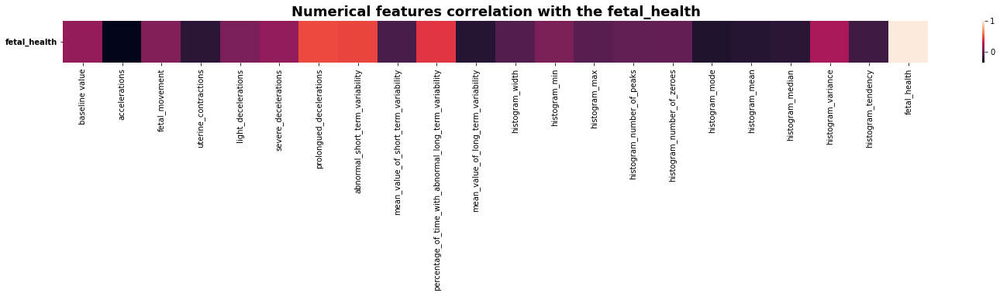

In [ ]:
# Find out the highest correlation with fetal health
numeric_data = df_cleaned.select_dtypes(exclude="object")
numeric_corr = numeric_data.corr()
f,ax=plt.subplots(figsize=(25,1))
sns.heatmap(numeric_corr.sort_values(by=["fetal_health"], ascending=False).head(1))
plt.title("Numerical features correlation with the fetal_health", weight="bold", fontsize=18)
plt.yticks(weight="bold", rotation=0)

plt.show()

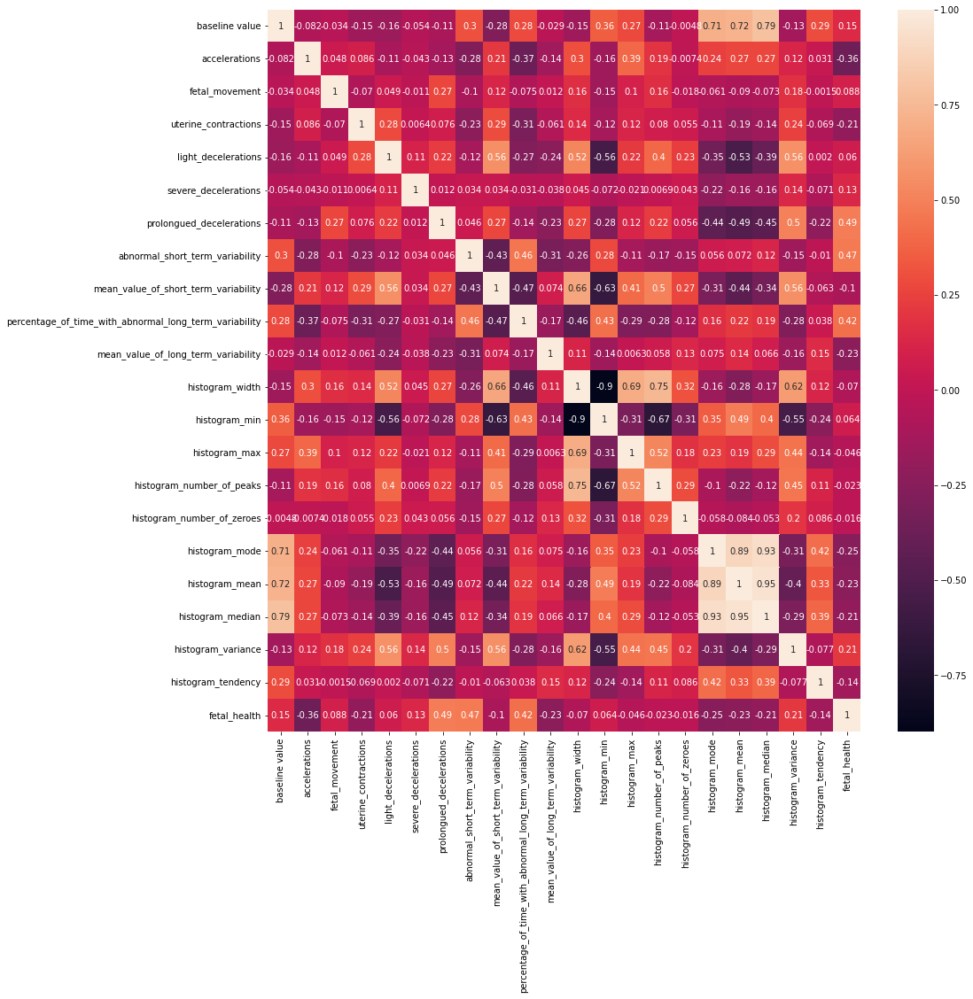

In [ ]:
#Pearson Correlation Heat Map

plt.figure(figsize=(15,15))
cor1=df_cleaned.corr()
sns.heatmap(df_cleaned.corr(), annot=True)

In [ ]:
# Dropping attributes not involved in the EDA and prediction model
#printing the attributes involved in the EDA
plt.figure(figsize=(10,10))
eda = df_cleaned.drop(["accelerations", "mean_value_of_long_term_variability", "histogram_mode", "histogram_mean", "histogram_median", 'uterine_contractions', 'histogram_tendency' ], axis=1)

eda.head(20)

,baseline value,fetal_movement,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_variance,fetal_health
0,120.0,0.000,0.000,0.0,0.000,73.0,0.5,43.0,64.0,62.0,126.0,2.0,0.0,73.0,2.0
1,132.0,0.000,0.003,0.0,0.000,17.0,2.1,0.0,130.0,68.0,198.0,6.0,1.0,12.0,1.0
2,133.0,0.000,0.003,0.0,0.000,16.0,2.1,0.0,130.0,68.0,198.0,5.0,1.0,13.0,1.0
3,134.0,0.000,0.003,0.0,0.000,16.0,2.4,0.0,117.0,53.0,170.0,11.0,0.0,13.0,1.0
4,132.0,0.000,0.000,0.0,0.000,16.0,2.4,0.0,117.0,53.0,170.0,9.0,0.0,11.0,1.0
5,134.0,0.000,0.009,0.0,0.002,26.0,5.9,0.0,150.0,50.0,200.0,5.0,3.0,170.0,3.0
6,134.0,0.000,0.008,0.0,0.003,29.0,6.3,0.0,150.0,50.0,200.0,6.0,3.0,215.0,3.0
7,122.0,0.000,0.000,0.0,0.000,83.0,0.5,6.0,68.0,62.0,130.0,0.0,0.0,3.0,3.0
8,122.0,0.000,0.000,0.0,0.000,84.0,0.5,5.0,68.0,62.0,130.0,0.0,0.0,3.0,3.0
9,122.0,0.000,0.000,0.0,0.000,86.0,0.3,6.0,68.0,62.0,130.0,1.0,0.0,1.0,3.0


<Figure size 720x720 with 0 Axes>

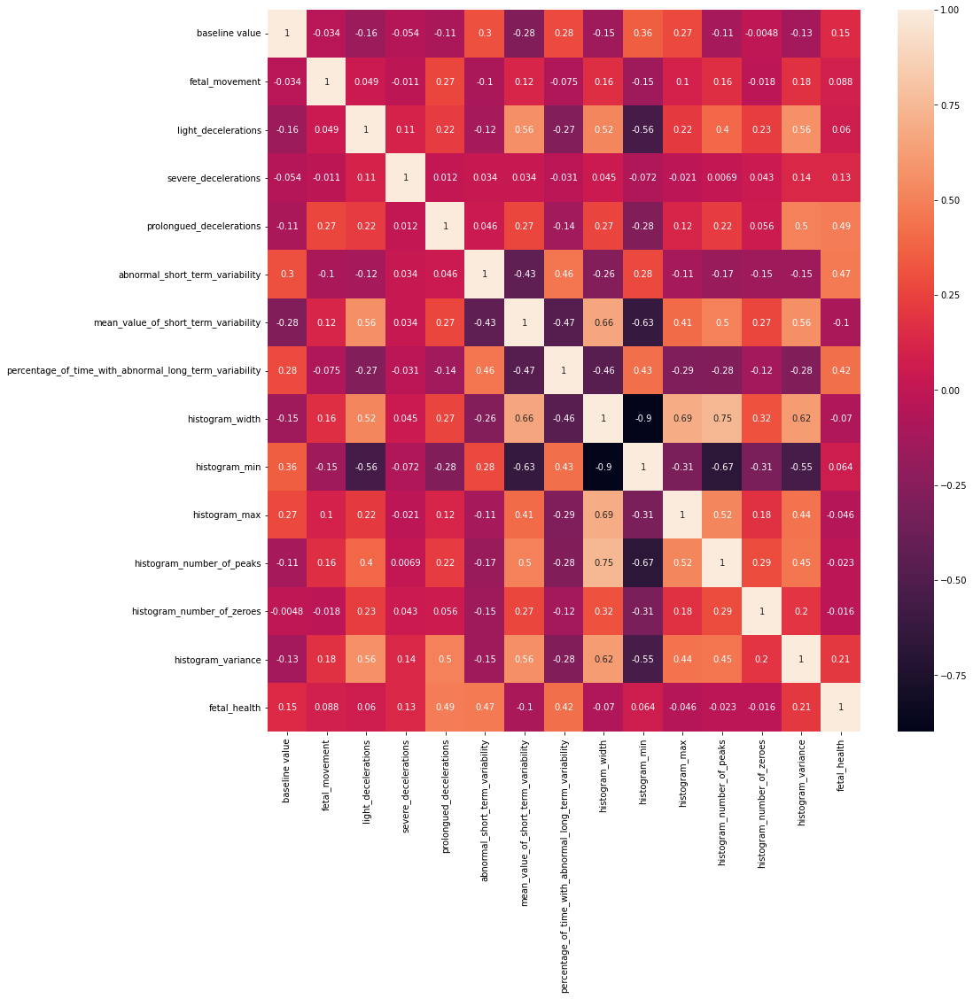

In [ ]:
#Pearson Correlation Heat Map After Removing Weak Correlation With Fetal Health
plt.figure(figsize=(15,15))
cor1= eda.corr()
sns.heatmap(eda.corr(), annot=True)

In [ ]:
fetal_health_status = df_cleaned.fetal_health.value_counts()
print(fetal_health_status)

1.0    1646
2.0     292
3.0     175
Name: fetal_health, dtype: int64


In [ ]:
df_cleaned=eda

In [ ]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2113 entries, 0 to 2125
Data columns (total 15 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2113 non-null   float64
 1   fetal_movement                                          2113 non-null   float64
 2   light_decelerations                                     2113 non-null   float64
 3   severe_decelerations                                    2113 non-null   float64
 4   prolongued_decelerations                                2113 non-null   float64
 5   abnormal_short_term_variability                         2113 non-null   float64
 6   mean_value_of_short_term_variability                    2113 non-null   float64
 7   percentage_of_time_with_abnormal_long_term_variability  2113 non-null   float64
 8   histogram_width                       

## Data Preperation for Machine Learning

1.0    1655
2.0     295
3.0     176
Name: fetal_health, dtype: int64


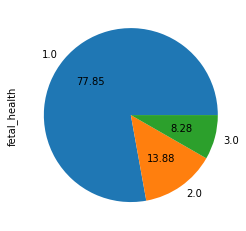

In [ ]:

# CHECK IMBALANCE DATA
# Check the imbalance value of the original form of dataset
# assign all attributes excluding the fetal health attribute to the variable x.
x = ori_df.drop(["fetal_health"], axis=1)

# assign fetal health attribute to the variable y.
y = ori_df["fetal_health"]

# print the values of the two classes under the fetal health column
print(y.value_counts())

# plot a pie chart of for the fetal health column
y.value_counts().plot.pie(autopct="%.2f")

1.0    1646
2.0     292
3.0     175
Name: fetal_health, dtype: int64


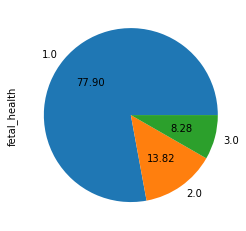

In [ ]:

# Show the preprocessed dataset of dependent variable to check for imbalance data

# assign all attributes excluding the fetal_health attribute to the variable x.
x = df_cleaned.drop(["fetal_health"], axis=1)

# assign fetal_health attribute to the variable y.
y = df_cleaned["fetal_health"]

# print the values of the two classes under the fetal_health column
print(y.value_counts())

# plot a pie chart for the fetal_health column
y.value_counts().plot.pie(autopct="%.2f")

In [ ]:

from sklearn.utils import resample
#create two different dataframe of majority and minority class
df_majority = df_cleaned[(df_cleaned['fetal_health']==1)]
df_minority = df_cleaned[(df_cleaned['fetal_health']==2)]
df_minority2 = df_cleaned[(df_cleaned['fetal_health']==3)]
# upsample minority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,    # sample with replacement
                                 n_samples= 1646, # to match majority class
                                 random_state=42)  # reproducible results

df_minority_upsampled2 = resample(df_minority2,
                                 replace=True,    # sample with replacement
                                 n_samples= 1646, # to match majority class
                                 random_state=42)  # reproducible results
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_minority_upsampled,df_minority_upsampled2, df_majority])

2.0    1646
3.0    1646
1.0    1646
Name: fetal_health, dtype: int64


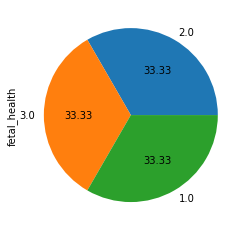

In [ ]:
# assign all attributes excluding the fetal_health attribute to the variable x.
x = df_upsampled.drop(["fetal_health"], axis=1)

# assign the survival status attribute to the variable y.
y = df_upsampled["fetal_health"]

# print the values of the two classes under the survival status column
print(y.value_counts())

# plot a pie chart for the survival status column
y.value_counts().plot.pie(autopct="%.2f")

In [ ]:
#assigning values to features as X and target as y
X=df_upsampled.drop(["fetal_health"],axis=1)
y=df_upsampled["fetal_health"]

#Set up a standard scaler for the features
from sklearn import preprocessing
col_names = list(X.columns)
s_scaler = preprocessing.StandardScaler()
X_df= s_scaler.fit_transform(X)
X_df = pd.DataFrame(X_df, columns=col_names)
X_df.describe()

,baseline value,fetal_movement,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_variance
count,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03,4.938000e+03
mean,-2.302285e-17,-3.741213e-17,-8.057998e-17,-5.755713e-18,-1.151143e-17,-2.302285e-16,-1.151143e-16,2.302285e-17,-3.453428e-17,-1.841828e-16,3.510985e-16,-5.755713e-18,-1.438928e-18,1.726714e-17
std,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00
min,-2.880801e+00,-2.322813e-01,-6.271210e-01,-1.080645e-01,-4.754984e-01,-2.593215e+00,-1.014356e+00,-7.252451e-01,-1.460049e+00,-1.362331e+00,-2.185757e+00,-1.256095e+00,-4.143482e-01,-5.953663e-01
25%,-6.993113e-01,-2.322813e-01,-6.271210e-01,-1.080645e-01,-4.754984e-01,-7.152786e-01,-8.178326e-01,-7.252451e-01,-9.618243e-01,-9.753415e-01,-6.485564e-01,-9.425475e-01,-4.143482e-01,-5.725213e-01
50%,-1.043595e-01,-2.322813e-01,-6.271210e-01,-1.080645e-01,-4.754984e-01,2.823750e-01,-3.265241e-01,-5.686102e-01,-5.596065e-02,7.017106e-03,-1.714942e-01,-3.154524e-01,-4.143482e-01,-4.811414e-01
75%,7.880681e-01,-1.826496e-01,2.815420e-01,-1.080645e-01,-4.754984e-01,6.344880e-01,5.578311e-01,5.278338e-01,8.499030e-01,9.893757e-01,5.706026e-01,6.251902e-01,-4.143482e-01,2.270525e-01
max,2.473765e+00,7.725333e+00,3.916194e+00,9.253733e+00,4.482295e+00,1.808198e+00,5.667439e+00,2.838198e+00,2.548397e+00,1.882429e+00,3.963045e+00,4.387761e+00,1.245390e+01,5.549929e+00


In [ ]:

from sklearn.model_selection import train_test_split


# Split data in 80:20 ratio. 80% for training, 20% for testing
# random_state = 42 is used to select the 20% of the data set for testing randomly
x_train, x_test, y_train, y_test = train_test_split (X_df, y, test_size=0.20, random_state=42)

print (y_train.head ())


2031    3.0
461     2.0
1726    1.0
334     3.0
98      2.0
Name: fetal_health, dtype: float64


In [ ]:
#  Check proportion of dataset after splitting
print('{0:0.2f}% in training set'.format((len(x_train) / len(df_upsampled.index)) * 100))
print('{0:0.2f}% in test set'.format((len(x_test) / len(df_upsampled.index)) * 100))

79.99% in training set
20.01% in test set



## Machine Learning (Gradient Boosting, Decision Tree, Logistic Regression)


In [ ]:
# GRADIENT BOOSTING
from sklearn.ensemble import GradientBoostingClassifier
# Baseline model of gradient boosting classifier with default parameters:
gb = GradientBoostingClassifier(random_state=48)

# Train the model using X_train and Y_train of the dataset variables
gb.fit(x_train, y_train)

GradientBoostingClassifier(random_state=48)

In [ ]:
# Predict and store fetal health status based on predictors (train and test dataset)
gb_pred_train = gb.predict(x_train)
gb_pred_test = gb.predict(x_test)

In [ ]:
# Print the predicted values of test dataset using GRADIENT BOOSTING
print(gb_pred_test)

[3. 1. 2. 3. 2. 1. 1. 2. 1. 2. 1. 1. 3. 3. 2. 1. 1. 1. 2. 2. 2. 1. 3. 3.
 1. 1. 1. 2. 3. 3. 3. 2. 3. 1. 2. 3. 2. 2. 2. 1. 3. 3. 2. 2. 3. 1. 3. 3.
 3. 3. 2. 2. 2. 2. 3. 3. 3. 1. 1. 2. 2. 2. 2. 2. 1. 2. 3. 2. 1. 2. 1. 3.
 2. 1. 2. 1. 1. 3. 2. 3. 2. 2. 1. 1. 2. 3. 2. 3. 2. 2. 3. 1. 1. 3. 3. 1.
 2. 2. 2. 3. 2. 2. 3. 2. 1. 3. 1. 3. 1. 1. 2. 1. 2. 2. 2. 1. 2. 3. 2. 2.
 2. 2. 2. 3. 2. 2. 3. 2. 3. 2. 3. 3. 2. 1. 2. 2. 3. 3. 2. 3. 3. 2. 3. 2.
 2. 2. 2. 3. 2. 1. 1. 1. 3. 3. 1. 1. 3. 2. 3. 1. 2. 3. 2. 2. 2. 2. 3. 2.
 3. 1. 2. 3. 3. 3. 1. 3. 2. 1. 1. 3. 3. 3. 1. 3. 2. 2. 2. 3. 1. 2. 3. 3.
 3. 2. 2. 2. 3. 2. 1. 1. 2. 2. 2. 3. 3. 1. 1. 3. 3. 2. 1. 3. 3. 2. 1. 3.
 3. 1. 2. 1. 3. 1. 3. 2. 3. 3. 1. 1. 3. 1. 2. 2. 1. 2. 1. 1. 2. 2. 2. 1.
 3. 3. 3. 2. 2. 2. 1. 2. 3. 3. 2. 1. 1. 3. 1. 2. 3. 1. 3. 1. 1. 3. 2. 2.
 1. 1. 1. 1. 3. 1. 1. 2. 3. 3. 3. 1. 3. 3. 1. 3. 2. 2. 1. 2. 3. 1. 2. 1.
 3. 3. 2. 3. 2. 3. 1. 2. 2. 2. 3. 2. 1. 2. 1. 2. 2. 1. 1. 1. 2. 2. 2. 2.
 3. 2. 1. 3. 2. 1. 2. 2. 2. 1. 3. 1. 2. 2. 3. 2. 1.

In [ ]:
# Show the accuracy result of train and test dataset using GRADIENT BOOSTING model
from sklearn.metrics import accuracy_score
print("Accuracy for train set: {0:0.4f}".format(accuracy_score(y_train, gb_pred_train)))
print("Accuracy for test set: {0:0.4f}".format(accuracy_score(y_test, gb_pred_test)))

Accuracy for train set: 0.9808
Accuracy for test set: 0.9575


In [ ]:
from sklearn.metrics import accuracy_score, precision_score,  recall_score, roc_curve, auc

print('Accuracy: %0.4f' % accuracy_score(y_test, gb_pred_test))
print('Precision: %0.4f' % precision_score(y_test, gb_pred_test, average='macro'))
print('Recall: %0.4f' % recall_score(y_test, gb_pred_test, average='macro'))

Accuracy: 0.9575
Precision: 0.9599
Recall: 0.9592


In [ ]:
# Perfomance evaluation of the GRADIENT BOOSTING model
# via confusion matrix and classification report.

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = pd.DataFrame (confusion_matrix(y_test, gb_pred_test))
cm['Total'] = np.sum(cm,axis =1)
cm = cm.append (np.sum(cm, axis=0),ignore_index=True)
cm.columns = ['Predicted Normal', 'Predicted Suspect', 'Predicted Pathological','Total']
cm = cm.set_index([['Actual Normal', 'Actual Suspect', 'Actual Pathological', 'Total']])
print("Confusion matrix of GRADIENT BOOSTING")
print (cm)

# Print classification report
from sklearn.metrics import classification_report
print("\nClassification report of GRADIENT BOOSTING:")
print(classification_report (y_test, gb_pred_test))

Confusion matrix of GRADIENT BOOSTING
                     Predicted Normal  Predicted Suspect  \
Actual Normal                     308                 30   
Actual Suspect                      7                337   
Actual Pathological                 0                  0   
Total                             315                367   

                     Predicted Pathological  Total  
Actual Normal                             5    343  
Actual Suspect                            0    344  
Actual Pathological                     301    301  
Total                                   306    988  

Classification report of GRADIENT BOOSTING:
              precision    recall  f1-score   support

         1.0       0.98      0.90      0.94       343
         2.0       0.92      0.98      0.95       344
         3.0       0.98      1.00      0.99       301

    accuracy                           0.96       988
   macro avg       0.96      0.96      0.96       988
weighted avg       0.96  

In [ ]:
# CROSS VALIDATION FOR GRADIENT BOOSTING
# to evaluate and validate the model through iterations

from sklearn.model_selection import KFold, cross_val_score

cv_gb = GradientBoostingClassifier(random_state=42)

#Peform k_fold cross validation
k_folds = KFold(n_splits = 10)

#output score of cross validation for gb
scores = cross_val_score(cv_gb, x_train, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.97721519 0.93924051 0.96708861 0.96455696 0.9721519  0.96962025
 0.95696203 0.97974684 0.98987342 0.95949367]
Average CV Score:  0.9675949367088608
Number of CV Scores used in Average:  10


### Logistic Regression

In [ ]:
# LOGISTIC REGRESSION
# Import sklearn linear library to perform logistic regression
from sklearn.linear_model import LogisticRegression

# Logistic Regression model function will be assigned into LR model variable
LRmodel=LogisticRegression()

# Train the model using X_train and Y_train of the dataset variables
LRmodel.fit(x_train, y_train)

LogisticRegression()

In [ ]:
# Predict and store fetal health status based on predictors (train and test dataset)
lr_pred_train = LRmodel.predict(x_train)
lr_pred_test = LRmodel.predict(x_test)

In [ ]:
# Print the predicted values of test dataset using logistic regression
print(lr_pred_test)

[3. 1. 2. 3. 3. 1. 1. 1. 1. 2. 2. 1. 3. 2. 1. 1. 2. 1. 3. 2. 3. 1. 3. 3.
 1. 2. 1. 1. 3. 3. 2. 2. 3. 1. 2. 3. 2. 2. 2. 1. 3. 3. 2. 2. 3. 1. 3. 3.
 3. 3. 2. 2. 2. 2. 3. 3. 3. 1. 1. 2. 3. 3. 1. 3. 1. 1. 2. 2. 1. 2. 1. 3.
 2. 1. 2. 1. 1. 3. 2. 3. 2. 2. 2. 2. 2. 3. 2. 3. 1. 2. 3. 1. 1. 3. 2. 1.
 2. 2. 2. 3. 2. 2. 3. 2. 1. 3. 2. 3. 2. 1. 2. 1. 2. 2. 2. 1. 2. 3. 3. 1.
 2. 2. 2. 2. 2. 2. 2. 2. 3. 2. 3. 3. 1. 3. 2. 2. 3. 3. 2. 3. 3. 2. 3. 2.
 2. 2. 2. 3. 2. 1. 1. 1. 3. 3. 2. 1. 3. 2. 3. 1. 2. 3. 2. 2. 2. 1. 3. 3.
 3. 1. 1. 3. 2. 3. 1. 3. 2. 1. 1. 3. 3. 3. 2. 3. 2. 2. 2. 2. 1. 2. 3. 3.
 3. 2. 2. 2. 2. 2. 1. 1. 2. 2. 2. 2. 3. 1. 1. 2. 3. 2. 1. 2. 3. 2. 1. 3.
 3. 1. 1. 1. 3. 1. 3. 2. 3. 3. 3. 1. 3. 1. 2. 2. 1. 2. 1. 1. 2. 2. 2. 1.
 2. 3. 3. 2. 2. 2. 1. 2. 3. 3. 3. 1. 1. 3. 1. 2. 3. 1. 3. 2. 1. 3. 2. 2.
 1. 2. 1. 1. 2. 1. 1. 2. 3. 3. 3. 1. 3. 3. 1. 3. 2. 2. 1. 2. 3. 1. 2. 1.
 2. 2. 2. 3. 2. 3. 1. 2. 1. 2. 3. 2. 1. 2. 1. 2. 2. 1. 1. 1. 2. 1. 2. 3.
 3. 2. 1. 2. 2. 1. 2. 2. 1. 1. 2. 1. 1. 2. 3. 2. 1.

In [ ]:
# Show the accuracy result of train and test dataset using logistic regression model
from sklearn.metrics import accuracy_score
print("Accuracy for train set: {0:0.4f}".format(accuracy_score(y_train, lr_pred_train)))
print("Accuracy for test set: {0:0.4f}".format(accuracy_score(y_test, lr_pred_test)))

Accuracy for train set: 0.8395
Accuracy for test set: 0.8310


In [ ]:
from sklearn.metrics import accuracy_score, precision_score,  recall_score

print('Accuracy: %0.4f' % accuracy_score(y_test, lr_pred_test))
print('Precision: %0.4f' % precision_score(y_test, lr_pred_test, average='macro'))
print('Recall: %0.4f' % recall_score(y_test, lr_pred_test,average='macro'  ))

Accuracy: 0.8310
Precision: 0.8358
Recall: 0.8321


In [ ]:
# Perfomance evaluation of the LOGISTIC REGRESSION model
# via confusion matrix and classification report.

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = pd.DataFrame (confusion_matrix(y_test, lr_pred_test))
cm['Total'] = np.sum(cm,axis =1)
cm = cm.append (np.sum(cm, axis=0),ignore_index=True)
cm.columns = ['Predicted Normal', 'Predicted Suspect', 'Predicted Pathological','Total']
cm = cm.set_index([['Actual Normal', 'Actual Suspect', 'Actual Pathological', 'Total']])
print("Confusion matrix of LOGISTIC REGRESSION:")
print (cm)

# Print classification report
from sklearn.metrics import classification_report
print("\nClassification report of LOGISTIC REGRESSION:")
print(classification_report (y_test, lr_pred_test))

Confusion matrix of LOGISTIC REGRESSION:
                     Predicted Normal  Predicted Suspect  \
Actual Normal                     281                 49   
Actual Suspect                     30                282   
Actual Pathological                 2                 41   
Total                             313                372   

                     Predicted Pathological  Total  
Actual Normal                            13    343  
Actual Suspect                           32    344  
Actual Pathological                     258    301  
Total                                   303    988  

Classification report of LOGISTIC REGRESSION:
              precision    recall  f1-score   support

         1.0       0.90      0.82      0.86       343
         2.0       0.76      0.82      0.79       344
         3.0       0.85      0.86      0.85       301

    accuracy                           0.83       988
   macro avg       0.84      0.83      0.83       988
weighted avg       0

In [ ]:
# CROSS VALIDATION FOR LOGISTIC REGRESSION
# to evaluate and validate the model through iterations

from sklearn.model_selection import KFold, cross_val_score

cv_lr = LogisticRegression()

#Peform k_fold cross validation
k_folds = KFold(n_splits = 10)

#output score of cross validation for gb
scores = cross_val_score(cv_lr, x_train, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.87341772 0.83037975 0.83291139 0.83797468 0.84810127 0.81772152
 0.81265823 0.82278481 0.87594937 0.83797468]
Average CV Score:  0.838987341772152
Number of CV Scores used in Average:  10


### Decision Tree

In [ ]:
# DECISION TREE
# Import decision tree model from sklearn library to perform decision tree classification
from sklearn.tree import DecisionTreeClassifier

# Train the shuffled X_train and Y_train for decision tree classification
DecisionTree = DecisionTreeClassifier(random_state=48)
DecisionTree.fit(x_train,y_train)


# Predict and store fetal health status based on predictors (train and test dataset)
DecisionTree_pred_train = DecisionTree.predict(x_train)
DecisionTree_pred_test = DecisionTree.predict(x_test)

In [ ]:
# Print the predicted values of test dataset using decision tree
print(DecisionTree_pred_test)

[3. 1. 2. 3. 2. 1. 1. 2. 1. 2. 2. 1. 3. 3. 1. 1. 1. 1. 2. 2. 2. 1. 3. 3.
 1. 1. 1. 2. 3. 3. 3. 2. 3. 1. 2. 3. 2. 2. 2. 1. 3. 3. 1. 2. 3. 1. 3. 3.
 3. 3. 2. 2. 2. 2. 3. 3. 3. 1. 1. 2. 2. 2. 2. 2. 1. 2. 3. 2. 1. 2. 1. 3.
 2. 1. 2. 1. 1. 3. 2. 3. 2. 2. 1. 1. 2. 3. 2. 3. 2. 2. 3. 1. 1. 3. 3. 1.
 2. 2. 2. 3. 1. 2. 3. 2. 1. 3. 1. 3. 1. 1. 2. 2. 2. 2. 1. 1. 2. 3. 2. 2.
 2. 2. 2. 3. 2. 2. 3. 2. 3. 2. 3. 3. 2. 1. 2. 2. 3. 3. 2. 3. 3. 2. 3. 1.
 1. 2. 2. 3. 2. 1. 1. 1. 3. 3. 2. 1. 3. 2. 3. 2. 2. 3. 1. 2. 2. 2. 3. 2.
 3. 1. 2. 3. 3. 3. 1. 3. 2. 1. 1. 3. 3. 3. 2. 3. 2. 2. 2. 3. 1. 2. 3. 3.
 3. 2. 2. 2. 3. 2. 1. 1. 2. 2. 2. 3. 3. 1. 1. 3. 3. 2. 1. 3. 3. 2. 1. 3.
 3. 1. 2. 1. 3. 1. 3. 2. 3. 3. 1. 1. 3. 1. 2. 2. 1. 2. 1. 1. 2. 2. 2. 1.
 3. 3. 3. 2. 2. 2. 1. 2. 3. 3. 2. 1. 1. 3. 1. 2. 3. 1. 3. 1. 1. 3. 2. 2.
 1. 1. 1. 1. 3. 1. 1. 2. 3. 3. 3. 1. 3. 3. 1. 3. 2. 2. 1. 2. 3. 1. 2. 1.
 3. 3. 1. 3. 2. 3. 1. 2. 1. 2. 3. 2. 1. 1. 1. 2. 2. 1. 1. 1. 2. 2. 2. 2.
 3. 2. 1. 3. 2. 1. 2. 2. 2. 1. 3. 1. 2. 2. 3. 2. 1.

In [ ]:
# Show the accuracy result of train and test dataset using decision tree model
from sklearn.metrics import accuracy_score
print("Accuracy for train set: {0:0.4f}".format(accuracy_score(y_train, DecisionTree_pred_train)))
print("Accuracy for test set: {0:0.4f}".format(accuracy_score(y_test, DecisionTree_pred_test)))

Accuracy for train set: 0.9997
Accuracy for test set: 0.9818


In [ ]:
from sklearn.metrics import accuracy_score, precision_score,  recall_score, roc_curve, auc

print('Accuracy: %0.4f' % accuracy_score(y_test, DecisionTree_pred_test))
print('Precision: %0.4f' % precision_score(y_test, DecisionTree_pred_test,average='macro'))
print('Recall: %0.4f' % recall_score(y_test, DecisionTree_pred_test, average='macro'))

Accuracy: 0.9818
Precision: 0.9830
Recall: 0.9825


In [ ]:
# Perfomance evaluation of the DECISION TREE model
# via confusion matrix and classification report.

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = pd.DataFrame (confusion_matrix(y_test, DecisionTree_pred_test))
cm['Total'] = np.sum(cm,axis =1)
cm = cm.append (np.sum(cm, axis=0),ignore_index=True)
cm.columns = ['Predicted Normal', 'Predicted Suspect', 'Predicted Pathological','Total']
cm = cm.set_index([['Actual Normal', 'Actual Suspect', 'Actual Pathological', 'Total']])
print("Confusion matrix of DECISION TREE:")
print (cm)

# Print classification report
from sklearn.metrics import classification_report
print("\nClassification report of DECISION TREE:")
print(classification_report (y_test, DecisionTree_pred_test))

Confusion matrix of DECISION TREE:
                     Predicted Normal  Predicted Suspect  \
Actual Normal                     325                 16   
Actual Suspect                      0                344   
Actual Pathological                 0                  0   
Total                             325                360   

                     Predicted Pathological  Total  
Actual Normal                             2    343  
Actual Suspect                            0    344  
Actual Pathological                     301    301  
Total                                   303    988  

Classification report of DECISION TREE:
              precision    recall  f1-score   support

         1.0       1.00      0.95      0.97       343
         2.0       0.96      1.00      0.98       344
         3.0       0.99      1.00      1.00       301

    accuracy                           0.98       988
   macro avg       0.98      0.98      0.98       988
weighted avg       0.98      0.9

In [ ]:
# CROSS VALIDATION FOR DECISION TREE
# to evaluate and validate the model through iterations

from sklearn.model_selection import KFold, cross_val_score

cv_dt = DecisionTreeClassifier()

#Peform k_fold cross validation
k_folds = KFold(n_splits = 10)

#output score of cross validation for gb
scores = cross_val_score(cv_dt, x_train, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.97974684 0.97468354 0.96202532 0.98987342 0.96708861 0.98481013
 0.97721519 0.97974684 0.98987342 0.96202532]
Average CV Score:  0.9767088607594937
Number of CV Scores used in Average:  10


**Summary of Macine learning models**

---

Decision Tree achieves the highest result according to its perfromance matrices, confusion matrix and cross validation